In [1]:
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = "1"

In [2]:
import argparse
import os
import shutil
import time
import random
import torch.nn.functional as F
from sklearn.metrics import precision_score,recall_score

from torch.utils.data import TensorDataset
import torch
import pickle
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data as data
import torchvision.transforms as transforms
import torchvision.datasets as datasets
import numpy as np
import tarfile
from sklearn.cluster import KMeans
from sklearn import datasets
import urllib
import errno
import torchmetrics
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader, sampler


In [3]:
def mkdir_p(path):
    '''make dir if not exist'''
    try:
        os.makedirs(path)
    except OSError as exc:  # Python >2.5
        if exc.errno == errno.EEXIST and os.path.isdir(path):
            pass
        else:
            raise

In [4]:
#use_cuda = torch.cuda.is_available()


DATASET_PATH='./datasets/purchase'
DATASET_NAME= 'dataset_purchase'

if not os.path.isdir(DATASET_PATH):
	mkdir_p(DATASET_PATH)

DATASET_FILE = os.path.join(DATASET_PATH,DATASET_NAME)

if not os.path.isfile(DATASET_FILE):
	print("Dowloading the dataset...")
	urllib.request.urlretrieve("https://www.comp.nus.edu.sg/~reza/files/dataset_purchase.tgz",os.path.join(DATASET_PATH,'tmp.tgz'))
	print('Dataset Dowloaded')

	tar = tarfile.open(os.path.join(DATASET_PATH,'tmp.tgz'))
	tar.extractall(path=DATASET_PATH)


data_set =np.genfromtxt(DATASET_FILE,delimiter=',')

In [5]:
# Data preparing:
X = data_set[:,1:].astype(np.float64)
Y = (data_set[:,0]).astype(np.int32)-1

In [6]:
class CustomTensorDataset(Dataset):
    def __init__(self, tensors, transform=None):
        assert all(tensors[0].shape[0] == tensor.shape[0] for tensor in tensors)
        self.tensors = tensors
        self.transform = transform

    def __getitem__(self, index):
        X = self.tensors[0][index]
        if self.transform is not None:
            X = self.transform(X)
        return X, tuple(self.tensors[i][index] for i in range(1, len(self.tensors)))
    
    def __len__(self):
        return self.tensors[0].shape[0]

In [7]:
clf_train_idx, clf_test_idx = train_test_split(
    np.arange(len(Y)), test_size=0.5, shuffle=True, stratify=Y
)
batch_size=128
train_sampler = sampler.SubsetRandomSampler(clf_train_idx)
test_sampler = sampler.SubsetRandomSampler(clf_test_idx)
#creating clf_train and clf_test dataloader

# Convert X to a torch tensor and Y to a torch tensor of type int64
X_tensor = torch.tensor(X, dtype=torch.float32)
Y_tensor = torch.tensor(Y, dtype=torch.int64)

# Creating clf_train and clf_test DataLoader using TensorDataset
clf_train_dl = DataLoader(TensorDataset(X_tensor, Y_tensor), batch_size=batch_size, sampler=train_sampler)
clf_test_dl = DataLoader(TensorDataset(X_tensor, Y_tensor), batch_size=batch_size, sampler=test_sampler)


#creating attacker dataset
y_true_atk = [t for t in Y]
y_atk = np.zeros(len(X), dtype=int)
y_atk[clf_train_idx.tolist()] = 1

atk_trainds = CustomTensorDataset(
    tensors=(X,torch.tensor(y_true_atk), torch.tensor(y_atk))
)
atk_train_idx, atk_test_idx = train_test_split(
    np.arange(len(atk_trainds.tensors[2].tolist())), test_size=0.2, shuffle=True, stratify=atk_trainds.tensors[2].tolist()
)
atk_train_sampler = sampler.SubsetRandomSampler(atk_train_idx)
atk_test_sampler = sampler.SubsetRandomSampler(atk_test_idx)

atk_train_dl = DataLoader(atk_trainds, batch_size=batch_size, sampler=atk_train_sampler)
atk_test_dl = DataLoader(atk_trainds, batch_size=batch_size, sampler=atk_test_sampler)


In [8]:
# creating auxaliary dataset for pretraining attacker and Fe
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, TensorDataset, sampler

# Create a 50% subset of the atk_train_dl
subset_train_idx, _ = train_test_split(
    atk_train_idx, test_size=0.5, shuffle=True, stratify=atk_trainds.tensors[2][atk_train_idx].tolist()
)

# Create a new DataLoader with the 50% subset
subset_train_sampler = sampler.SubsetRandomSampler(subset_train_idx)
subset_train_dl = DataLoader(atk_trainds, batch_size=batch_size, sampler=subset_train_sampler)

# Create a 50% subset of the atk_test_dl
subset_test_idx, _ = train_test_split(
    atk_test_idx, test_size=0.5, shuffle=True, stratify=atk_trainds.tensors[2][atk_test_idx].tolist()
)

# Create a new DataLoader with the 50% subset
subset_test_sampler = sampler.SubsetRandomSampler(subset_test_idx)
subset_test_dl = DataLoader(atk_trainds, batch_size=batch_size, sampler=subset_test_sampler)


In [9]:
class FeatureExtractor(nn.Module):
    def __init__(self):
        super(FeatureExtractor, self).__init__()
        self.layers = nn.Sequential(
            nn.Linear(600, 512),
            nn.Tanh(),
            nn.Linear(512, 512),
            nn.Tanh(),
            nn.Linear(512, 256),
            nn.Tanh(),
            nn.Linear(256, 128),
            nn.Tanh(),
        )
    
    def forward(self, x):
        return self.layers(x)

In [10]:
# Instantiate the model
model = FeatureExtractor()

# Count the number of parameters
num_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f"Number of parameters: {num_params}")

Number of parameters: 734592


In [12]:
class PurchaseClassifier(nn.Module):
    def __init__(self):
        super(PurchaseClassifier, self).__init__()
        self.classifier = nn.Sequential(
            #nn.Linear(128, 256),
            #nn.ReLU(),
            #nn.Linear(256, 128),
            #nn.ReLU(),
            nn.Linear(128, 100)
        )

    def forward(self, x):
        out = self.classifier(x)
        return out

In [13]:
# Instantiate the model

model =  PurchaseClassifier()

# Count the number of parameters
num_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f"Number of parameters: {num_params}")

Number of parameters: 12900


In [14]:
class PurchaseAttacker(nn.Module):
    def __init__(self):
        super(PurchaseAttacker, self).__init__()
        self.classifier = nn.Sequential(
            #nn.Linear(1024, 512),
            #nn.ReLU(),
            #nn.Linear(512, 256),
            #nn.ReLU(),
            nn.Linear(128,256),
            nn.Tanh(),
            nn.Linear(256,128),
            nn.Tanh(),
            nn.Linear(128, 1)
        )

    def forward(self, x):
        out = self.classifier(x)
        return out

In [15]:
# Instantiate the model

model =  PurchaseAttacker()

# Count the number of parameters
num_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f"Number of parameters: {num_params}")

Number of parameters: 66049


In [16]:

def adjust_learning_rate(epoch, init_lr=0.001):
    schedule = [12]
    cur_lr = init_lr
    for schedule_epoch in schedule:
        if epoch >= schedule_epoch:
            cur_lr *= 0.1
    return cur_lr

In [17]:
from torchmetrics import Accuracy
#pretraining FE+CF
criterion = nn.CrossEntropyLoss()
def train_FE_CF(FE, CF, data_train_loader, current_lr, vis=None):
    FE.train()
    CF.train()
    FE_optimizer = optim.Adam(FE.parameters(), lr=current_lr, weight_decay=1e-4)
    CF_optimizer = optim.Adam(CF.parameters(), lr=current_lr, weight_decay=1e-4)

    loss_CF = 0
    acc = Accuracy().to(device)  # Add accuracy computation
    total_samples = 0
    correct_samples = 0
    for i, (images, labels) in enumerate(data_train_loader):
        if torch.cuda.is_available():
            #images, labels = images.cuda(), labels.cuda()
            images, labels = images.to(device), labels.to(device)


        features = FE(images)
        output_CF = CF(features)
        loss_CF = criterion(output_CF, labels)
        
        FE_optimizer.zero_grad()
        CF_optimizer.zero_grad()
        loss_CF.backward()
        CF_optimizer.step()
        FE_optimizer.step()

        # Update accuracy computation
        correct_samples += acc(output_CF, labels).item() * images.size(0)
        total_samples += images.size(0)

        if i % 100 == 0:
            current_accuracy = correct_samples / total_samples
            print('Epoch: {} [{}/{} ({:.0f}%)]\tLoss Classifier: {:.6f}\tTraining Accuracy: {:.6f}'.format(
                i, i * len(images), len(data_train_loader.dataset),
                100. * i / len(data_train_loader), loss_CF.item(), current_accuracy))

    return FE, CF


In [18]:
test_clf_loss=[]  # list to store loss values
def eval_clf(fe, clf, clf_test_dl, clf_criterion, device):
    fe.eval()
    clf.eval()
    acc = torchmetrics.Accuracy().to(device)
    loss = []
    with torch.no_grad():
        for (X, y) in clf_test_dl:
            X, y = X.to(device), y.to(device)
            features = fe(X)
            clf_y = clf(features)
            loss.append(clf_criterion(clf_y, y).item())
            test_clf_loss.append(loss)  # add loss to list
            acc(clf_y, y)
    loss = np.asarray(loss).mean()
    print(f'Classifier Loss: {loss} | Classifier Accuracy: {acc.compute()}')

In [19]:
# create a directory to save models
save_dir = os.path.join(os.getcwd(), 'purchase-100-2')
os.makedirs(save_dir, exist_ok=True)

# define the file name for each model
fe_model_file = os.path.join(save_dir, 'FE.pth')
cf_model_file = os.path.join(save_dir, 'CF.pth')
inf_model_file=os.path.join(save_dir,'INF.pth')

In [24]:
total_epoch=6000
lr=0.0001
device = 'cuda' if torch.cuda.is_available() else 'cpu'
#device='cpu'
clf_criterion = nn.CrossEntropyLoss().to(device)
def get_FE_CF():
    FE = FeatureExtractor().to(device)
    CF = PurchaseClassifier().to(device)
    if torch.cuda.is_available():
        if torch.cuda.device_count() > 1:
            FE = torch.nn.DataParallel(FE)
            CF = torch.nn.DataParallel(CF)
        #FE = FE.cuda()
        #CF = CF.cuda()
    try:
        for epoch in range(total_epoch):
            print("epoch %d" % epoch)
            current_lr = adjust_learning_rate(epoch, lr)
            FE, CF = train_FE_CF(FE, CF, clf_train_dl, current_lr, vis=None)
            #test_FE_CF2(FE, CF, clf_test_dl)
            eval_clf(FE,CF,clf_test_dl,clf_criterion,device)
    except KeyboardInterrupt:
        pass
    if torch.cuda.device_count() > 1:
        torch.save(FE.module, "Models/mix/pre_train/FE.pth")
        torch.save(CF.module, "Models/mix/pre_train/CF.pth")
    else:
        torch.save(FE, fe_model_file)
        torch.save(CF, cf_model_file)

    return FE, CF

In [25]:
#overfitting on data
FE, CF = get_FE_CF()

epoch 0
Epoch: 0 [0/197324 (0%)]	Loss Classifier: 4.607587	Training Accuracy: 0.015625
Epoch: 100 [12800/197324 (13%)]	Loss Classifier: 4.140368	Training Accuracy: 0.043239
Epoch: 200 [25600/197324 (26%)]	Loss Classifier: 3.394204	Training Accuracy: 0.086676
Epoch: 300 [38400/197324 (39%)]	Loss Classifier: 2.918666	Training Accuracy: 0.140365
Epoch: 400 [51200/197324 (52%)]	Loss Classifier: 2.678106	Training Accuracy: 0.188435
Epoch: 500 [64000/197324 (65%)]	Loss Classifier: 2.510330	Training Accuracy: 0.227685
Epoch: 600 [76800/197324 (78%)]	Loss Classifier: 2.208657	Training Accuracy: 0.263623
Epoch: 700 [89600/197324 (91%)]	Loss Classifier: 2.055208	Training Accuracy: 0.296875
Classifier Loss: 1.9132835493941251 | Classifier Accuracy: 0.5569722652435303
epoch 1
Epoch: 0 [0/197324 (0%)]	Loss Classifier: 1.907981	Training Accuracy: 0.523438
Epoch: 100 [12800/197324 (13%)]	Loss Classifier: 1.719046	Training Accuracy: 0.571860
Epoch: 200 [25600/197324 (26%)]	Loss Classifier: 1.599745	Tr

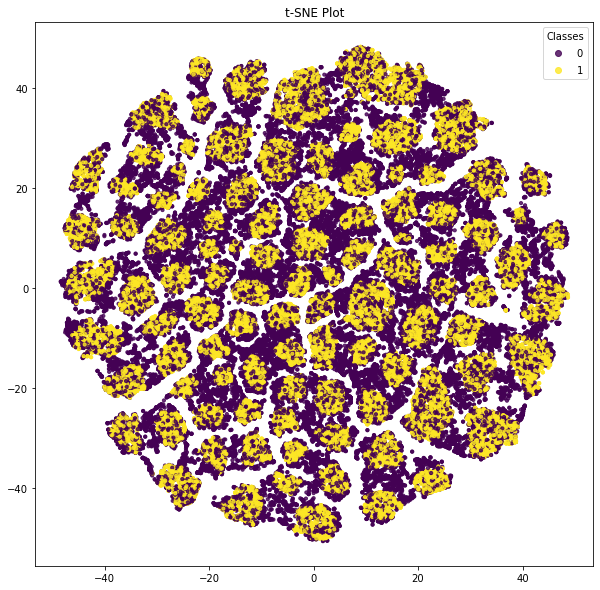

In [32]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Extract features from the attacker's dataset
def extract_features(fe, data_loader, device, num_samples=1000):
    fe.eval()
    features = []
    labels = []

    # Flatten the data_loader into a list of (X, (y1, y2)) tuples
    data_list = [(X, (y1, y2)) for (X, (y1, y2)) in data_loader]
    
    # Randomly select num_samples samples from the list
    selected_data = random.choices(data_list, k=num_samples)

    with torch.no_grad():
        for i, (X, (y1, y2)) in enumerate(selected_data):
            X, y1, y2 = X.float().to(device), y1.float().to(device), y2.float().to(device)
            X_features = fe(X)
            features.append(X_features.cpu().numpy())
            labels.append(y2.cpu().numpy())

    features = np.vstack(features)
    labels = np.hstack(labels)

    return features, labels

# Compute t-SNE embeddings
def compute_tsne(features, n_components=2, perplexity=30):
    tsne = TSNE(n_components=n_components, perplexity=perplexity, random_state=42)
    embeddings = tsne.fit_transform(features)
    return embeddings

# Plot t-SNE embeddings
def plot_tsne(embeddings, labels):
    plt.figure(figsize=(10, 10))
    scatter = plt.scatter(embeddings[:, 0], embeddings[:, 1], c=labels, cmap='viridis', s=10, alpha=0.8)
    plt.legend(*scatter.legend_elements(), title="Classes")
    plt.title("t-SNE Plot")
    plt.show()

# Main
#FE, _ = get_FE_CF()  # Assuming this function returns the pretrained FE and CF
FE=torch.load(fe_model_file)
FE.to(device)
features, labels = extract_features(FE, atk_train_dl, device)
tsne_embeddings = compute_tsne(features)
plot_tsne(tsne_embeddings, labels)


In [26]:
def freeze(model):
    for param in model.parameters():
        param.requires_grad_(False) 
    model.eval()

def unfreeze(model):
    for param in model.parameters():
        param.requires_grad_(True)
    model.train()

In [27]:
def get_precision_recall(outputs, labels):
    _, predicted = torch.max(outputs.data, 1)
    predicted = predicted.cpu().numpy()
    labels = labels.cpu().numpy()
    precision = precision_score(labels, predicted, average='macro',zero_division=0)
    recall = recall_score(labels, predicted, average='macro')
    return precision, recall

In [28]:
#train pretrained FE+attacker
atk_criterion = nn.BCEWithLogitsLoss().to(device)
train_loss = []
test_loss = []
test_acc = []
def train_FE_INF(FE, INF, data_train_loader, current_lr,device, vis=None):
    INF.train()
    INF_optimizer = optim.Adam(INF.parameters(), lr=current_lr, weight_decay=1e-4)

    loss_INF = 0
    running_precision=0
    running_recall=0
    freeze(FE)
    for i,(X, (y1, y2)) in enumerate(atk_train_dl):
        #if torch.cuda.is_available():
        X, y1,y2= X.float().to(device), y1.float().to(device),y2.float().to(device)
        features = FE(X)
        # feed them to the inf model
        pred_private_labels = INF(features)
        y2 = y2.unsqueeze(1)
        loss_INF =atk_criterion(pred_private_labels,y2.float())
        precision, recall = get_precision_recall(pred_private_labels,y2)
        
        INF_optimizer.zero_grad()
        loss_INF.backward()
        INF_optimizer.step()
        

        running_precision+= precision
        running_recall += recall
        
        if i % 100 == 0:
            print('Epoch: {} [{}/{} ({:.0f}%)]\tLoss attacker: {:.6f}\t Precision attacker: {:.6f}\t recall attacler: {:.6f}\t'.format(
                i, i * len(X), len(data_train_loader.dataset),
                100. * i / len(data_train_loader), loss_INF.detach().item(),
                running_precision/100,
                running_recall/100
                 ))
        running_recall=0
        running_precision=0
    unfreeze(FE)

    return FE, INF

In [29]:
test_atk_loss=[]  # list to store loss values
def eval_atk(fe, INF, atk_test_dl, atk_criterion, device):
    fe.eval()
    INF.eval()
    acc=torchmetrics.Accuracy(task='binary').to(device)
    loss = []
    with torch.no_grad():
         for i, (X, (y1, y2)) in enumerate(atk_test_dl):
            X, y1,y2 = X.float().to(device), y1.to(device),y2.float().to(device)
            features = fe(X)
            atk_y = INF(features).squeeze()
            loss.append(atk_criterion(atk_y, y2).item())
            test_atk_loss.append(loss)  # add loss to list
            acc(atk_y, y2.long())
    loss = np.asarray(loss).mean()
    print(f'Classifier Loss: {loss} | Classifier Accuracy: {acc.compute()}')

In [30]:
total_epoch=200
lr=0.0001
device = 'cuda' if torch.cuda.is_available() else 'cpu'
atk_criterion = nn.BCEWithLogitsLoss().to(device)
def get_FE_INF():
    FE = torch.load(fe_model_file)
    INF = PurchaseAttacker()
    if torch.cuda.is_available():
        FE = FE.cuda()
        INF = INF.cuda()
    try:
        for epoch in range(total_epoch):
            print("epoch %d" % epoch)
            current_lr = adjust_learning_rate(epoch, lr)
            FE, INF = train_FE_INF(FE, INF, atk_train_dl, current_lr, device,vis=None)
            #test_FE_INF(FE, INF, atk_test_dl,device)
            eval_atk(FE,INF,atk_test_dl,atk_criterion,device)
    except KeyboardInterrupt:
        pass
    if torch.cuda.device_count() > 1:
        torch.save(FE.module, "Models/mix/pre_train/FE.pth")
        torch.save(INF.module, "Models/mix/pre_train/CF.pth")
    else:
        #torch.save(FE, fe_model_file)
        torch.save(INF, inf_model_file)
    return FE, INF

In [31]:
FE, INF = get_FE_INF()

epoch 0
Epoch: 0 [0/197324 (0%)]	Loss attacker: 0.704210	 Precision attacker: 0.002266	 recall attacler: 0.005000	
Epoch: 100 [12800/197324 (8%)]	Loss attacker: 0.693420	 Precision attacker: 0.002656	 recall attacler: 0.005000	
Epoch: 200 [25600/197324 (16%)]	Loss attacker: 0.689153	 Precision attacker: 0.002305	 recall attacler: 0.005000	
Epoch: 300 [38400/197324 (24%)]	Loss attacker: 0.699074	 Precision attacker: 0.002383	 recall attacler: 0.005000	
Epoch: 400 [51200/197324 (32%)]	Loss attacker: 0.689928	 Precision attacker: 0.002305	 recall attacler: 0.005000	
Epoch: 500 [64000/197324 (41%)]	Loss attacker: 0.692105	 Precision attacker: 0.002695	 recall attacler: 0.005000	
Epoch: 600 [76800/197324 (49%)]	Loss attacker: 0.693463	 Precision attacker: 0.002695	 recall attacler: 0.005000	
Epoch: 700 [89600/197324 (57%)]	Loss attacker: 0.688005	 Precision attacker: 0.002812	 recall attacler: 0.005000	
Epoch: 800 [102400/197324 (65%)]	Loss attacker: 0.688811	 Precision attacker: 0.002461	 

In [36]:
criterion = nn.CrossEntropyLoss().cuda()
loss_fn = nn.BCEWithLogitsLoss().cuda()

def train(FE_model,INF_model, CF_model, trainloader, current_lr,current_lr_atk,tradoff=0.25 ):
    FE_model.train()
    INF_model.train()
    CF_model.train()
    #tradoff=0
    
    FE_optimizer = optim.Adam(FE_model.parameters(), lr=current_lr, weight_decay=1e-4)
    CF_optimizer = optim.Adam(CF_model.parameters(), lr=current_lr, weight_decay=1e-4)
    INF_optimizer = optim.Adam(INF_model.parameters(), lr=current_lr_atk, weight_decay=1e-4)
    
    for i, (images, (labels, privlabels)) in enumerate(trainloader):
        if torch.cuda.is_available():
            images, labels, privlabels = images.float().cuda(), labels.long().cuda(), privlabels.float().cuda()

        # get features from the feature extractor
        features = FE_model(images)
        
        # feed them to the inf model
        pred_private_labels = INF_model(features)
        loss_INF = loss_fn(pred_private_labels, privlabels.reshape(-1,1).float())

        # feed only private images==1 to the classifier
        classifier_features = features[privlabels == 1]
        output_CF = CF_model(classifier_features)
        loss_CF = criterion(output_CF, labels[privlabels == 1])
        
        # compute loss and backprop
        loss = -tradoff * loss_INF + (1. - tradoff) * loss_CF
        
        FE_optimizer.zero_grad()
        loss.backward()
        FE_optimizer.step()

        
         # get features from the feature extractor
        features = FE_model(images).detach()
        INF_optimizer.zero_grad()
        CF_optimizer.zero_grad()
        
        # feed them to the inf model
        pred_private_labels = INF_model(features)
        loss_INF = loss_fn(pred_private_labels, privlabels.reshape(-1,1).float())
        loss_INF.backward()
        INF_optimizer.step()

       
        # feed only private images to the classifier
        classifier_features = features[privlabels == 1]
        output_CF = CF_model(classifier_features)
        loss_CF = criterion(output_CF, labels[privlabels == 1])
        loss_CF.backward()
        CF_optimizer.step()

        if i % 100 == 0:
            print('Epoch: {} [{}/{} ({:.0f}%)]\tLoss Classifier: {:.6f}\tLoss Attacker: {:.6f}'.format(
                i, i * len(images), len(trainloader.dataset),
                100. * i / len(trainloader), loss_CF.item(), loss_INF.item()))

    return FE_model, INF_model, CF_model       

In [37]:
# create a directory to save models
save_dir = os.path.join(os.getcwd(), 'Purchase-AfterDefense-decrease')
os.makedirs(save_dir, exist_ok=True)

# define the file name for each model
fe_model_file_defense = os.path.join(save_dir, 'FE_defense.pth')
cf_model_file_defense = os.path.join(save_dir, 'CF_defense.pth')
inf_model_file_defense = os.path.join(save_dir, 'INF_defense.pth')

In [38]:
total_epoch=5000
lr=0.0001
lr_atk=1e-4
tradoff=0.25
def get_FE_defense():
    FE = torch.load(fe_model_file)
    CF = torch.load(cf_model_file)
    INF=torch.load(inf_model_file)
    if torch.cuda.is_available():
        FE = FE.cuda()
        CF = CF.cuda()
        INF = INF.cuda()
    try:
        for epoch in range(total_epoch):
            print("epoch %d" % epoch)
            current_lr = adjust_learning_rate(epoch, lr)
            current_lr_atk = adjust_learning_rate(epoch,lr_atk)
            FE, INF, CF =train(FE,INF, CF, atk_train_dl, current_lr,current_lr_atk, tradoff)
    except KeyboardInterrupt:
        pass
    if torch.cuda.device_count() > 1:
        torch.save(FE.module, "FE_defense.pth")
        torch.save(CF.module, "CF_defense.pth")
        torch.save(INF.module, "INF_defense.pth")
    else:
        torch.save(FE,fe_model_file_defense)
        torch.save(INF,inf_model_file_defense)
        torch.save(CF, cf_model_file_defense)
    return FE

In [39]:
FE=get_FE_defense()

epoch 0
Epoch: 0 [0/197324 (0%)]	Loss Classifier: 3.361866	Loss Attacker: 1.078975
Epoch: 100 [12800/197324 (8%)]	Loss Classifier: 0.186687	Loss Attacker: 0.909522
Epoch: 200 [25600/197324 (16%)]	Loss Classifier: 0.077864	Loss Attacker: 0.788115
Epoch: 300 [38400/197324 (24%)]	Loss Classifier: 0.349758	Loss Attacker: 0.804732
Epoch: 400 [51200/197324 (32%)]	Loss Classifier: 0.114388	Loss Attacker: 0.802983
Epoch: 500 [64000/197324 (41%)]	Loss Classifier: 0.581005	Loss Attacker: 0.856591
Epoch: 600 [76800/197324 (49%)]	Loss Classifier: 0.143501	Loss Attacker: 0.735686
Epoch: 700 [89600/197324 (57%)]	Loss Classifier: 0.093935	Loss Attacker: 0.827505
Epoch: 800 [102400/197324 (65%)]	Loss Classifier: 0.076005	Loss Attacker: 0.695700
Epoch: 900 [115200/197324 (73%)]	Loss Classifier: 0.048150	Loss Attacker: 0.700958
Epoch: 1000 [128000/197324 (81%)]	Loss Classifier: 0.167311	Loss Attacker: 0.671702
Epoch: 1100 [140800/197324 (89%)]	Loss Classifier: 0.264956	Loss Attacker: 0.724138
Epoch: 120

In [41]:
total_epoch=100
lr=0.0001
device = 'cuda' if torch.cuda.is_available() else 'cpu'
def get_INF_defense():
    FE = torch.load(fe_model_file_defense)
    #INF= AlexNet_attacker()
    INF=torch.load(inf_model_file_defense)
    if torch.cuda.is_available():
        FE = FE.cuda()
        INF = INF.cuda()
    try:
        for epoch in range(total_epoch):
            print("epoch %d" % epoch)
            current_lr = adjust_learning_rate(epoch,lr)
            FE, INF = train_FE_INF(FE, INF, atk_train_dl, current_lr, device,vis=None)
            #test_FE_INF(FE, INF, atk_test_dl,device)
            eval_atk(FE,INF,atk_test_dl,atk_criterion,device)
    except KeyboardInterrupt:
        pass

    return FE,INF

In [42]:
FE,INF = get_INF_defense()

epoch 0
Epoch: 0 [0/197324 (0%)]	Loss attacker: 0.688558	 Precision attacker: 0.002656	 recall attacler: 0.005000	
Epoch: 100 [12800/197324 (8%)]	Loss attacker: 0.711425	 Precision attacker: 0.002109	 recall attacler: 0.005000	
Epoch: 200 [25600/197324 (16%)]	Loss attacker: 0.668003	 Precision attacker: 0.002188	 recall attacler: 0.005000	
Epoch: 300 [38400/197324 (24%)]	Loss attacker: 0.713949	 Precision attacker: 0.002266	 recall attacler: 0.005000	
Epoch: 400 [51200/197324 (32%)]	Loss attacker: 0.687174	 Precision attacker: 0.002539	 recall attacler: 0.005000	
Epoch: 500 [64000/197324 (41%)]	Loss attacker: 0.703054	 Precision attacker: 0.002422	 recall attacler: 0.005000	
Epoch: 600 [76800/197324 (49%)]	Loss attacker: 0.689762	 Precision attacker: 0.002500	 recall attacler: 0.005000	
Epoch: 700 [89600/197324 (57%)]	Loss attacker: 0.683896	 Precision attacker: 0.003008	 recall attacler: 0.005000	
Epoch: 800 [102400/197324 (65%)]	Loss attacker: 0.677884	 Precision attacker: 0.002695	 

In [43]:
#train classifier after applying our defense
clf_criterion = nn.CrossEntropyLoss().to(device)
train_loss = []
test_loss = []
test_acc = []
def train_classifier_defense(FE, CF, data_train_loader, current_lr,device, vis=None):
    CF.train()
    #FE_optimizer = optim.Adam(FE.parameters(), lr=current_lr, weight_decay=1e-4)
    CF_optimizer = optim.Adam(CF.parameters(), lr=current_lr, weight_decay=1e-4)

    loss_CF = 0
    running_precision=0
    running_recall=0
    #freezing the FE
    freeze(FE)
    for i,(X, y) in enumerate(clf_train_dl):
        #if torch.cuda.is_available():
        X, y= X.to(device), y.to(device)

        features = FE(X)
        # feed them to the inf model
        out_CF=CF(features)
        #pred_private_labels= torch.round(pred_private_labels)
        #y2=y2.float()
        #y = y.unsqueeze(1)
        loss_CF =clf_criterion(out_CF,y)
        #precision, recall = get_precision_recall(out_CF,y)
        #FE_optimizer.zero_grad()
        CF_optimizer.zero_grad()
        loss_CF.backward()
        CF_optimizer.step()
        #FE_optimizer.step()

        #running_precision+= precision
        #running_recall += recall
        
        if i % 100 == 0:
            print('Epoch: {} [{}/{} ({:.0f}%)]\tLoss classifier: {:.6f}\t Precision classifier: {:.6f}\t recall classifier: {:.6f}\t'.format(
                i, i * len(X), len(data_train_loader.dataset),
                100. * i / len(data_train_loader), loss_CF.item(),
                running_precision/100,
                running_recall/100
                 ))
        running_recall=0
        running_precision=0
    unfreeze(FE)

    return  CF

In [44]:
def eval_clf_defense(fe, clf, clf_test_dl, clf_criterion, device):
    fe.eval()
    clf.eval()
    acc = torchmetrics.Accuracy().to(device)
    loss = []
    with torch.no_grad():
        for (X, y) in clf_test_dl:
            X, y = X.float().to(device), y.long().to(device)
            features = fe(X)
            clf_y = clf(features)
            loss.append(clf_criterion(clf_y, y).item())
            acc(clf_y, y)
    loss = np.asarray(loss).mean()
    print(f'Classifier Loss: {loss} | Classifier Accuracy: {acc.compute()}')

In [45]:
total_epoch=100
lr=0.001
device = 'cuda' if torch.cuda.is_available() else 'cpu'
def get_clf_defense():
    FE = torch.load(fe_model_file_defense)
    #CF= AlexNet_predictor()
    CF=torch.load(cf_model_file_defense)
    if torch.cuda.is_available():
        FE = FE.cuda()
        CF= CF.cuda()
    try:
        for epoch in range(total_epoch):
            print("epoch %d" % epoch)
            current_lr = adjust_learning_rate(epoch, lr)
            CF= train_classifier_defense(FE, CF, clf_train_dl, current_lr, device,vis=None)
            eval_clf_defense(FE, CF, clf_test_dl, clf_criterion, device)
    except KeyboardInterrupt:
        pass

    return CF

In [46]:
cf= get_clf_defense()

epoch 0
Epoch: 0 [0/197324 (0%)]	Loss classifier: 0.100715	 Precision classifier: 0.000000	 recall classifier: 0.000000	
Epoch: 100 [12800/197324 (13%)]	Loss classifier: 0.155693	 Precision classifier: 0.000000	 recall classifier: 0.000000	
Epoch: 200 [25600/197324 (26%)]	Loss classifier: 0.183244	 Precision classifier: 0.000000	 recall classifier: 0.000000	
Epoch: 300 [38400/197324 (39%)]	Loss classifier: 0.174515	 Precision classifier: 0.000000	 recall classifier: 0.000000	
Epoch: 400 [51200/197324 (52%)]	Loss classifier: 0.104844	 Precision classifier: 0.000000	 recall classifier: 0.000000	
Epoch: 500 [64000/197324 (65%)]	Loss classifier: 0.187126	 Precision classifier: 0.000000	 recall classifier: 0.000000	
Epoch: 600 [76800/197324 (78%)]	Loss classifier: 0.105578	 Precision classifier: 0.000000	 recall classifier: 0.000000	
Epoch: 700 [89600/197324 (91%)]	Loss classifier: 0.175843	 Precision classifier: 0.000000	 recall classifier: 0.000000	
Classifier Loss: 0.8205422257712225 | C